#                                                  NLP End Term 

# Dataset - Flipkart Reviews

In [13]:
# Importing pandas library
import pandas as pd

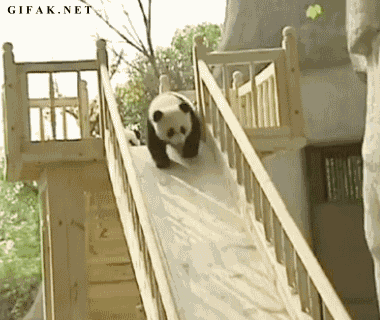

In [14]:
# Read csv file
data = pd.read_csv('Review_data.csv')

In [15]:
data # viewing dataset

,Reviews,Rating
0,It was nice produt. I like it's design a lot. ...,5
1,awesome sound....very pretty to see this nd th...,5
2,awesome sound quality. pros 7-8 hrs of battery...,4
3,I think it is such a good product not only as ...,5
4,awesome bass sound quality very good bettary l...,5
...,...,...
9971,GoodREAD MORE,5
9972,Everything is amazimg but the built is very li...,5
9973,GoodREAD MORE,5
9974,Best headphone i have ever used....READ MORE,5


# Exploring Dataset

In [16]:
# loads the dataset and prints first 5 rows
data.head()

,Reviews,Rating
0,It was nice produt. I like it's design a lot. ...,5
1,awesome sound....very pretty to see this nd th...,5
2,awesome sound quality. pros 7-8 hrs of battery...,4
3,I think it is such a good product not only as ...,5
4,awesome bass sound quality very good bettary l...,5


In [17]:
#loads the dataset and prints the bottom 5 rows
data.tail()

,Reviews,Rating
9971,GoodREAD MORE,5
9972,Everything is amazimg but the built is very li...,5
9973,GoodREAD MORE,5
9974,Best headphone i have ever used....READ MORE,5
9975,NiceREAD MORE,5


In [18]:
# Check the basic information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9976 entries, 0 to 9975
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Reviews  9976 non-null   object
 1   Rating   9976 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 156.0+ KB


In [19]:
# Summary Statistics
data.describe()

,Rating
count,9976.000000
mean,4.215417
std,1.167911
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [20]:
# Dimensions of dataset
data.shape 

(9976, 2)

In [21]:
#Check types for all the columns
data.dtypes

Reviews    object
Rating      int64
dtype: object

In [22]:
data.iloc[1:3, 0:2]  #First and Second rows and first 2 columns

,Reviews,Rating
1,awesome sound....very pretty to see this nd th...,5
2,awesome sound quality. pros 7-8 hrs of battery...,4


In [23]:
#Let's check if there are any missing values in the dataset
print(data.isnull().sum()) #So the dataset does not have any null values.

Reviews    0
Rating     0
dtype: int64


# Importing Libraries

In [27]:
import matplotlib.pyplot as plt
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from nltk.stem.snowball import SnowballStemmer
sn_stemmer = SnowballStemmer("english")
import re
import nltk
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [28]:
# unique ratings
pd.unique(data['Rating'])

array([5, 4, 1, 3, 2], dtype=int64)

# Bar Graph

<AxesSubplot:xlabel='Rating', ylabel='count'>

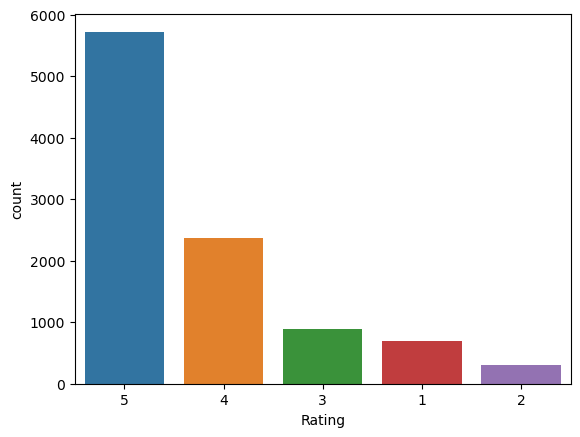

In [29]:
#the distribution of ratings in the dataset
sns.countplot(data=data,
              x='Rating',
              order=data.Rating.value_counts().index)

# Observation
**Majority of the ratings lies between 4 and 5**
**Approx 60% of the customers have given 5 out of 5 ratings to the products they buy from Flipkart**

In [30]:
rating_4_and_more = data[data["Rating"] >= 4]
rating_less_than_4  = data[data["Rating"] < 4]
print(rating_4_and_more.shape)
print(rating_less_than_4.shape)

(8091, 2)
(1885, 2)


# Wordcloud

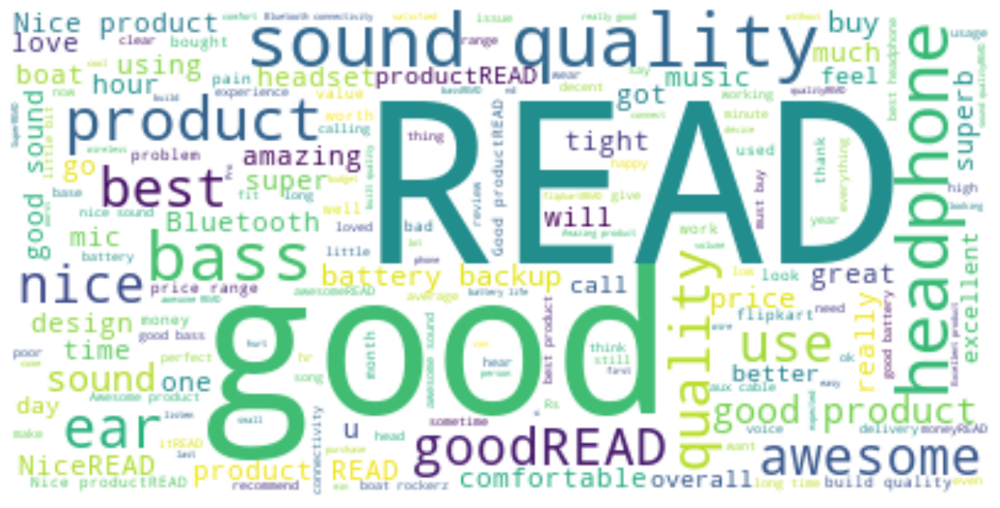

In [31]:
from wordcloud import WordCloud, STOPWORDS
text = " ".join(i for i in data.Reviews)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords,background_color="white").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

1. <a href="#1.-Data-Cleaning">Cleaning the Data</a>
2. <a href="#2.-Sentiment-Analysis">Sentiment Analysis</a>
3. <a href="#3.-Vectorization">Vectorization</a>
4. <a href="#4.-Logistic-Regression">Logistic Regression</a>
5. <a href="#5.-Heat-Map">Heat Map</a>
6. <a href="#6.-Clustering">Clustering</a>
7. <a href="#7,-Elbow-Plot">Elbow Plot</a>
8. <a href="#8.-Word-Cloud">Word Cloud</a>

# Now the movie begins

## 1. Cleaning the Data

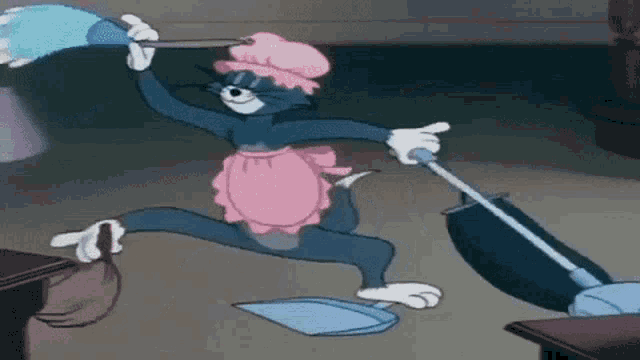

In [34]:
def new_function(x):
    #Converting to lower case
    x = x.lower()
    from nltk.corpus import stopwords
    stopwords = set(stopwords.words('english'))
    
    #Removing stop words
    y=nltk.word_tokenize(x)
    temp=[]
    for i in y:
        if i in stopwords: 
            pass
        else:
            temp.append(i)
    my_new_string=' '.join(temp)       
    
    #Lemmatizing the data
    c=nltk.word_tokenize(my_new_string)
    my_list=[]
    for i in c:
        my_list.append(lemmatizer.lemmatize(i))
        my_new_string_second=' '.join(my_list)
           
    #Stemming the data.
        d=nltk.word_tokenize(my_new_string_second)
    my_list_stemmer=[]
    for i in d:
        my_list_stemmer.append(sn_stemmer.stem(i))
        final=' '.join(my_list_stemmer)
 
    #Removing the numbers from the data.
        temp=[]
    for i in final:
        if i.isdigit(): 
            pass
        else:
            temp.append(i)
    hi=''.join(temp)
    return (hi) 

In [35]:
# applying the function and storing it in a new column
data['Clean_reviews'] = data['Reviews'].apply(new_function)

In [36]:
data

,Reviews,Rating,Clean_reviews
0,It was nice produt. I like it's design a lot. ...,5,nice produt . like 's design lot . 's easi car...
1,awesome sound....very pretty to see this nd th...,5,awesom sound .... pretti see nd sound qualiti ...
2,awesome sound quality. pros 7-8 hrs of battery...,4,awesom sound qualiti . pro - hr batteri life (...
3,I think it is such a good product not only as ...,5,think good product per qualiti also design qui...
4,awesome bass sound quality very good bettary l...,5,awesom bass sound qualiti good bettari long li...
...,...,...,...
9971,GoodREAD MORE,5,goodread
9972,Everything is amazimg but the built is very li...,5,everyth amazimg built light .. read
9973,GoodREAD MORE,5,goodread
9974,Best headphone i have ever used....READ MORE,5,best headphon ever use .... read


## 2. Sentiment Analysis

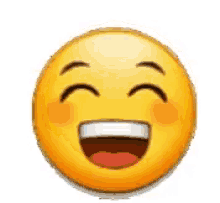

In [37]:
#Importing Libraries
from nltk.corpus import opinion_lexicon
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize

In [38]:
positive_wds = set(opinion_lexicon.positive())
negative_wds = set(opinion_lexicon.negative())

In [39]:
#check, if a word is in a dictionary or not
'joy' in positive_wds

True

# Sentiment Score

In [40]:
def score_sent(x):
    """Returns a score btw -1 and 1"""
    y=word_tokenize(x)
    temp = []
    for i in y:
        if i in positive_wds:
            temp.append(1)
        elif i in negative_wds:
            temp.append(-1)
        else:
            temp.append(0)
           
    score = sum(temp) / len(temp)
    return score

In [41]:
score_sent('This is a happy sad sentence, i am in a good mood today')

0.07142857142857142

In [42]:
# applying the function and storing it in a new column
data['Sentiment'] = data['Clean_reviews'].apply(score_sent)

In [43]:
data

,Reviews,Rating,Clean_reviews,Sentiment
0,It was nice produt. I like it's design a lot. ...,5,nice produt . like 's design lot . 's easi car...,0.133333
1,awesome sound....very pretty to see this nd th...,5,awesom sound .... pretti see nd sound qualiti ...,0.133333
2,awesome sound quality. pros 7-8 hrs of battery...,4,awesom sound qualiti . pro - hr batteri life (...,0.060606
3,I think it is such a good product not only as ...,5,think good product per qualiti also design qui...,0.081081
4,awesome bass sound quality very good bettary l...,5,awesom bass sound qualiti good bettari long li...,0.000000
...,...,...,...,...
9971,GoodREAD MORE,5,goodread,0.000000
9972,Everything is amazimg but the built is very li...,5,everyth amazimg built light .. read,0.000000
9973,GoodREAD MORE,5,goodread,0.000000
9974,Best headphone i have ever used....READ MORE,5,best headphon ever use .... read,0.166667


# Classifying Scores

In [44]:
def sentiment_classifier(x):
    temp = 0
    if x > 0:
        temp = 'Postive'
    elif x < 0:
        temp = 'Negative'
    else:
        temp = 'Neutral'
    return temp

In [45]:
# applying the function and storing it in a new column
data['Sentiment_class'] = data['Sentiment'].apply(sentiment_classifier)

In [46]:
data

,Reviews,Rating,Clean_reviews,Sentiment,Sentiment_class
0,It was nice produt. I like it's design a lot. ...,5,nice produt . like 's design lot . 's easi car...,0.133333,Postive
1,awesome sound....very pretty to see this nd th...,5,awesom sound .... pretti see nd sound qualiti ...,0.133333,Postive
2,awesome sound quality. pros 7-8 hrs of battery...,4,awesom sound qualiti . pro - hr batteri life (...,0.060606,Postive
3,I think it is such a good product not only as ...,5,think good product per qualiti also design qui...,0.081081,Postive
4,awesome bass sound quality very good bettary l...,5,awesom bass sound qualiti good bettari long li...,0.000000,Neutral
...,...,...,...,...,...
9971,GoodREAD MORE,5,goodread,0.000000,Neutral
9972,Everything is amazimg but the built is very li...,5,everyth amazimg built light .. read,0.000000,Neutral
9973,GoodREAD MORE,5,goodread,0.000000,Neutral
9974,Best headphone i have ever used....READ MORE,5,best headphon ever use .... read,0.166667,Postive


In [47]:
# count of each sentiment label
data['Sentiment_class'].value_counts()

Postive     6247
Neutral     3184
Negative     545
Name: Sentiment_class, dtype: int64

# Pie Chart

<AxesSubplot:ylabel='Sentiment_class'>

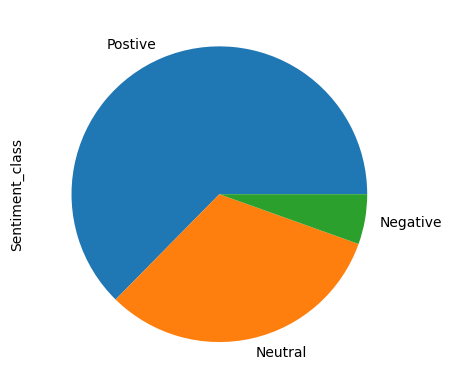

In [48]:
# Chart Type as Pie
data['Sentiment_class'].value_counts().plot(kind='pie')

# Observation

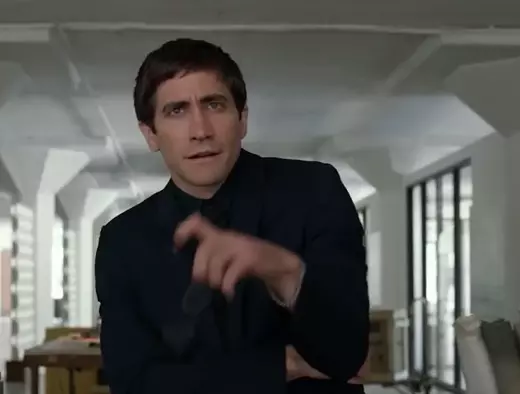

**Most people gave positive reviews, and a small proportion of people gave negative reviews**
**So we can say that people are satisfied with Flipkart products and services**

In [49]:
# Importing Libraries
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt

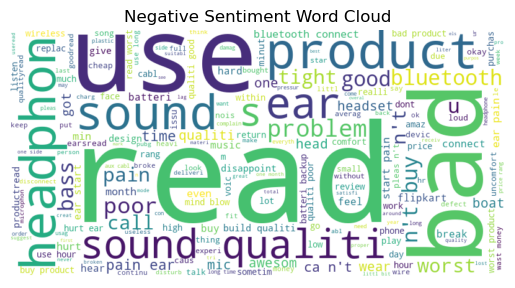

In [50]:
# Get all the reviews with negative sentiment
neg = data['Clean_reviews'][data['Sentiment_class'] == "Negative"]

# Combine all the reviews into a single string
combine = ' '.join(word for word in neg.astype(str))
wc = WordCloud(width=800, height=400, background_color="white").generate(combine)
    
# Plot the word cloud
plt.figure()
plt.axis('off')
plt.title('Negative Sentiment Word Cloud')
plt.imshow(wc, interpolation='bilinear')

# Label Encoding

In [51]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder() # initialising

In [52]:
# Encode the ratings
y = le.fit_transform(data['Rating'])

## 3. Vectorization

In [53]:
# CountVectorizer

In [55]:
from sklearn.feature_extraction.text import CountVectorizer
# Initialising 
vectorizer = CountVectorizer()# create a CountVectorizer object

# fit the vectorizer to your data
vectorizer.fit(data['Clean_reviews'])

# Getting the vectors
vector = vectorizer.transform(data['Clean_reviews'])

In [56]:
# Stroing the vector as a dataframe
X = pd.DataFrame(vector.toarray())

# Train,Test and Split

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

**This will split the dataset into training and testing sets with 30% of the data used for testing**

## 4. Logistic Regression

In [58]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression() # Initialising
lr_model = lr.fit(X_train, y_train) # Training the model

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [59]:
y_pred = lr_model.predict(X_test) # predicting on test set

# Evaluating the Model

In [69]:
from sklearn.metrics import confusion_matrix, accuracy_score

# Confusion Matrix

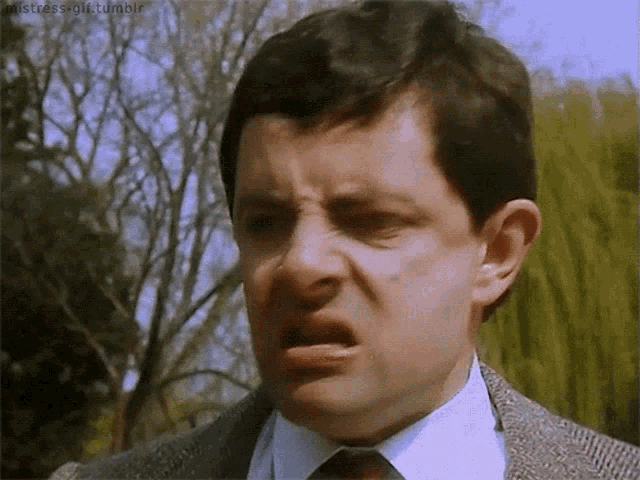

In [70]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

Confusion Matrix:
 [[ 111    7   22   18   53]
 [  29    8   16   15   28]
 [  13    4   49   65  103]
 [   7    9   46  161  477]
 [   5    2   28  122 1595]]


# Accuracy Score

In [71]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6428332776478449


# Observation
**The confusion matrix shows that the number is 111 reviews were correctly classified as belonging to class 1**
**The accuracy score is 0.64525, which is not very high.This means that our model is able to correctly predict the sentiment of the reviews about 64.28% of the time**

## 5. Heatmap

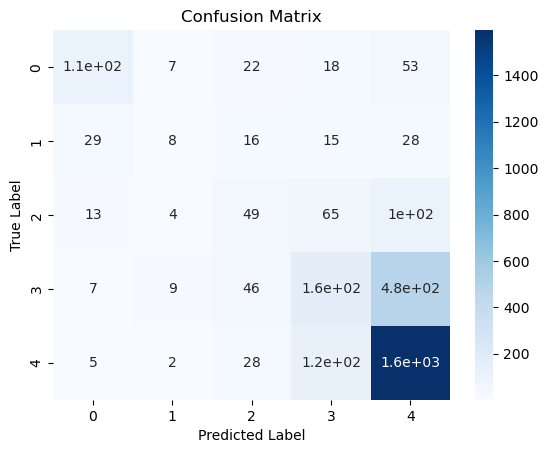

In [72]:
import seaborn as sns
sns.heatmap(cm, annot=True,cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Observation
**The heatmap shows that the model is making the most errors in predicting ratings of 3 and 4. The lighter colors represent higher values,indicates that there are more errors in those cells**

## 6. CLUSTERING

In [73]:
# KMeans clustering 
from sklearn.cluster import KMeans
# initialising
km = KMeans(n_clusters=5)
km_model = km.fit(X) #fitting kmeans

In [75]:
# function
temp=[]
for i in range(7):
    km = KMeans(n_clusters=i+1)
    km_model = km.fit(X)
    output = km_model.inertia_
    temp.append(output)

## 7. Elbow Plot

Text(0, 0.5, 'Distortion')

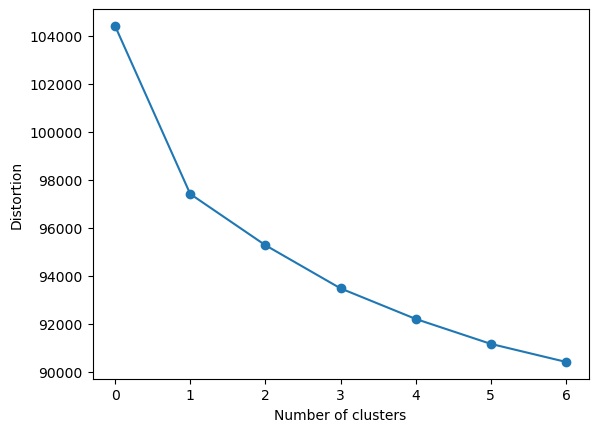

In [76]:
plt.plot(temp,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

In [72]:
# storing the labels in new column
data['Clusters'] = km.labels_

In [73]:
data['Clusters'].value_counts()

1    5677
3    1873
0    1553
2     873
Name: Clusters, dtype: int64

In [74]:
data['Clean_reviews'].values

array(["nice produt . like 's design lot . 's easi carri . . look stylish.read",
       'awesom sound .... pretti see nd sound qualiti good wish take product love product 😍😍😍read',
       'awesom sound qualiti . pro - hr batteri life ( includ  min approx call time ) awesom sound output . bass trebl realli clear without equalis . equalis , sound wari depend handset sound quality.weightless carri head toomic good , traffic good ( ./ ) .mm option realli import mention . realli expect lead brand implement this.consveri tight ear . adjust ok .. tight ... read',
       ..., 'goodread', 'best headphon ever use .... read', 'niceread'],
      dtype=object)

In [75]:
# checking the type of variable
type(data['Clean_reviews'].values)

numpy.ndarray

In [76]:
# Assigning string
text = str(data['Clean_reviews'].values)

In [77]:
text

'["nice produt . like \'s design lot . \'s easi carri . . look stylish.read"\n \'awesom sound .... pretti see nd sound qualiti good wish take product love product 😍😍😍read\'\n \'awesom sound qualiti . pro - hr batteri life ( includ  min approx call time ) awesom sound output . bass trebl realli clear without equalis . equalis , sound wari depend handset sound quality.weightless carri head toomic good , traffic good ( ./ ) .mm option realli import mention . realli expect lead brand implement this.consveri tight ear . adjust ok .. tight ... read\'\n ... \'goodread\' \'best headphon ever use .... read\' \'niceread\']'

## 8. Word Cloud

In [78]:
# Importing Libraries
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt

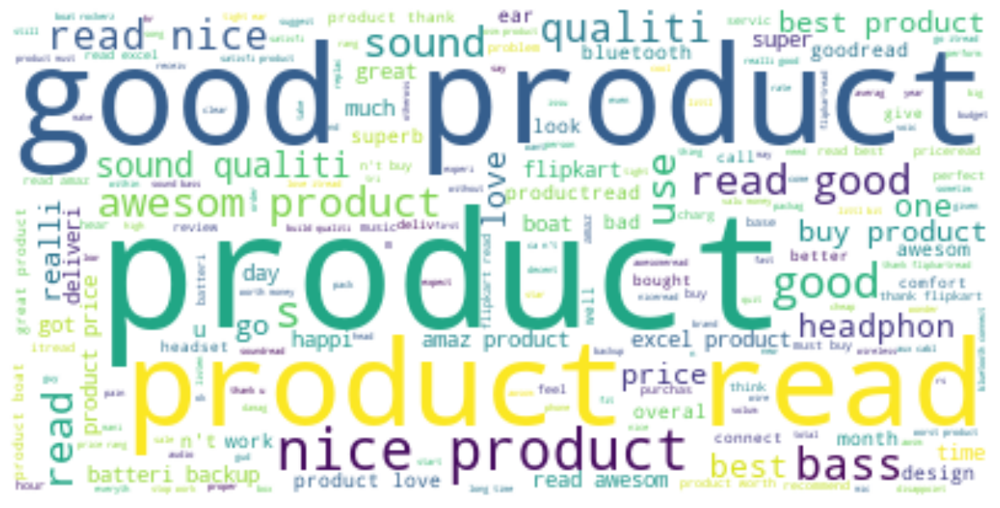

In [88]:
wordcloud = WordCloud(background_color="white").generate(text)

plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# wordcloud for each cluster

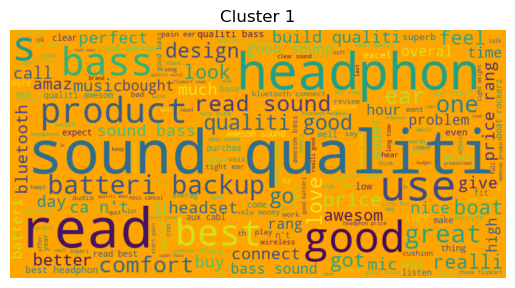

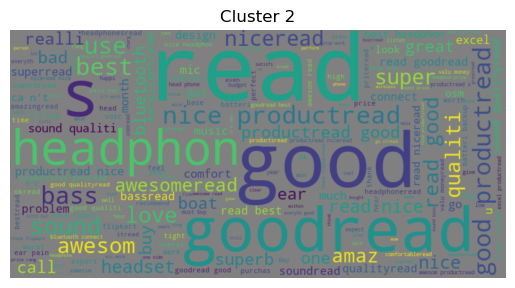

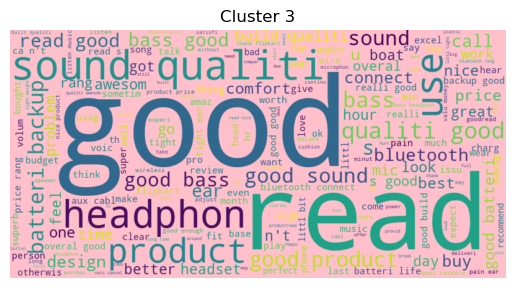

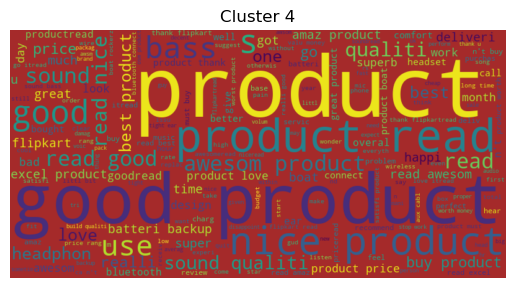

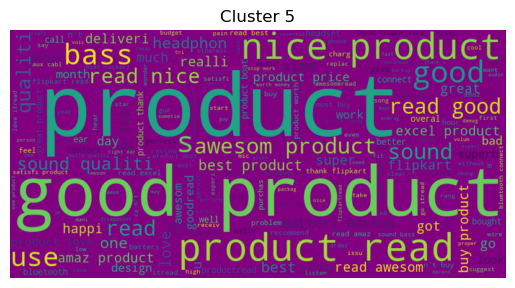

In [87]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
colors = ['orange', 'grey', 'pink','brown', 'purple']
num_clusters = 5

for i in range(num_clusters):
    cluster = data[data['Clusters'] == i]
    if len(cluster) > 0:
        text = ' '.join(cluster['Clean_reviews'].tolist())
    wordcloud = WordCloud(width=800, height=400, background_color=colors[i]).generate(text)
    plt.figure()
    plt.title('Cluster ' + str(i+1))
    plt.axis('off')
    plt.imshow(wordcloud,interpolation='bilinear')
    plt.show()

[<a href="#NLP-End-Term">Back to Top</a>

# I did It

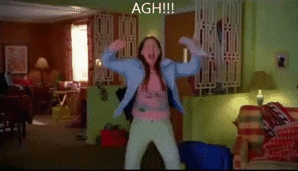